In [1]:
!rm -rf thesis
!git clone -b on_exp https://github.com/yosefnuragaw/thesis
%cd thesis
# !pip install --upgrade accelerate transformers
# !pip install flash-attn --no-build-isolation

Cloning into 'thesis'...
remote: Enumerating objects: 14801, done.
remote: Counting objects: 100% (20/20), done.
remote: Compressing objects: 100% (6/6), done.
remote: Total 14801 (delta 13), reused 17 (delta 12), pack-reused 14781 (from 4)
Receiving objects: 100% (14801/14801), 410.40 MiB | 24.74 MiB/s, done.
Resolving deltas: 100% (5179/5179), done.
Updating files: 100% (5214/5214), done.
/kaggle/working/thesis


In [2]:
import matplotlib.pyplot as plt
from typing import Dict
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import make_interp_spline # Import fungsi untuk menghaluskan garis
from typing import Dict

def plot_bipo_data(data_bipo: Dict[str, Dict[str, Dict[float, float]]]):
    """
    Fungsi untuk membuat line plot yang SMOOTH dari nested dictionary.
    Membuat 2 plot berdasarkan kategori (Coherence dan Behavioral).
    """
    first_key = list(data_bipo.keys())[0]
    metrics = list(data_bipo[first_key].keys())
    
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    
    for i, metric in enumerate(metrics):
        ax = axes[i] 
        
        for layer_name, layer_data in data_bipo.items():
            if metric in layer_data:
                # 1. Ambil data asli (pastikan berurutan)
                # Diurutkan berdasarkan sumbu X (multiplier) agar interpolasi tidak error
                sorted_items = sorted(layer_data[metric].items())
                x_values = np.array([item[0] for item in sorted_items])
                y_values = np.array([item[1] for item in sorted_items])
                
                # --- PROSES SMOOTHING (INTERPOLASI) ---
                # 2. Buat sumbu X baru yang jauh lebih padat (misal 300 titik)
                x_smooth = np.linspace(x_values.min(), x_values.max(), 300)
                
                # 3. Hitung nilai Y baru berdasarkan titik X yang padat menggunakan B-Spline
                # k=3 artinya interpolasi kubik (standar untuk kurva yang mulus)
                spline = make_interp_spline(x_values, y_values, k=3) 
                y_smooth = spline(x_smooth)
                # -------------------------------------

                # 4. Plot garis yang sudah dihaluskan
                ax.plot(x_smooth, y_smooth, label=f'{layer_name}', linewidth=2.0)
                
                # 5. (Opsional) Tetap tampilkan titik (marker) aslinya agar jelas data aslinya di mana
                ax.scatter(x_values, y_values, marker='o', s=30, zorder=5)
        
        # Styling grafik
        ax.set_title(f'{metric} Evaluation')
        ax.set_xlabel('Multiplier')
        ax.set_ylabel(f'Average {metric} Score')
        ax.grid(True, linestyle='-', linewidth=1.5, alpha=0.5)
        ax.legend(loc='lower right')
    
    plt.tight_layout()
    plt.show()

# --- Contoh Cara Memanggilnya Tetap Sama ---
# plot_bipo_data(data)
# --- Contoh Penggunaan Fungsi ---


In [11]:
import torch
import matplotlib.pyplot as plt
import os
import math
from typing import Optional

def plot_layer_comparison_grid(vec_dir, act_dir, epoch, target_layers, model_id=None, mul=1.0, cols=5, absolute_layer: Optional[int] = None):
    num_plots = len(target_layers)
    rows = math.ceil(num_plots / cols)
    
    fig, axes = plt.subplots(rows, cols, figsize=(6 * cols, 6 * rows), squeeze=False)
    axes_flat = axes.flatten()
    
    fig.suptitle(f"Steering Projection: {model_id} (Epoch {epoch}, Mul {mul})", fontsize=18, y=1.02)

    # NEW: Dictionary to store the dispersion metrics for quantitative analysis
    dispersion_metrics = {}

    for i, layer in enumerate(target_layers):
        ax = axes_flat[i]
        try:
            # 1. Setup Paths
            if absolute_layer != None:
                v_path = os.path.join(vec_dir, f"vec_ep{epoch}_layer{absolute_layer}.pt")
            else:
                v_path = os.path.join(vec_dir, f"vec_ep{epoch}_layer{layer}.pt")
            pos_path = os.path.join(act_dir, f"{model_id}_buffer_{layer}_{mul}.pt")
            neg_path = os.path.join(act_dir, f"{model_id}_buffer_{layer}_{-mul}.pt")

            steering_vec = torch.load(v_path, map_location='cpu').to(torch.float32)
            
            def load_and_stack(path):
                data = torch.load(path, map_location='cpu')
                if isinstance(data, list):
                    return torch.stack([t.detach().cpu().to(torch.float32).reshape(-1) for t in data])
                return data.to(torch.float32)

            pos_activations = load_and_stack(pos_path)
            neg_activations = load_and_stack(neg_path)

            # --- NEW: Calculate True High-Dimensional Dispersion ---
            # Calculate centroid and mean squared distance for Original (+)
            pos_centroid = torch.mean(pos_activations, dim=0)
            pos_dispersion = torch.mean(torch.sum((pos_activations - pos_centroid) ** 2, dim=1)).item()
            
            # Calculate centroid and mean squared distance for Original (-)
            neg_centroid = torch.mean(neg_activations, dim=0)
            neg_dispersion = torch.mean(torch.sum((neg_activations - neg_centroid) ** 2, dim=1)).item()
            
            # Print to console to see the snowball effect live
            print(f"Layer {layer:02d} | Pos Dispersion: {pos_dispersion:.2f} | Neg Dispersion: {neg_dispersion:.2f}")
            
            # Store metrics for plotting later
            dispersion_metrics[layer] = {
                'pos': pos_dispersion,
                'neg': neg_dispersion
            }
            # -------------------------------------------------------

            # 3. Basis Construction
            r_prime = steering_vec / torch.norm(steering_vec)
            gen = torch.Generator().manual_seed(42)
            k = torch.randn(steering_vec.shape[-1], generator=gen)
            k = (k - torch.dot(k, r_prime) * r_prime)
            k = k / torch.norm(k)

            # 4. Projection Logic
            # Original Points
            x_pos, y_pos = (pos_activations @ r_prime).numpy(), (pos_activations @ k).numpy()
            x_neg, y_neg = (neg_activations @ r_prime).numpy(), (neg_activations @ k).numpy()


            # 5. Plotting
            # Plot Original (Dimmed)
            ax.scatter(x_pos, y_pos, color='#1f90ce', alpha=0.9, s=15, label='Original (+)')
            ax.scatter(x_neg, y_neg, color='#ffab23', alpha=0.9, s=15, label='Original (-)')
            
            ax.axhline(0, color='black', lw=0.5, ls='--')
            ax.axvline(0, color='black', lw=0.5, ls='--')
            ax.set_title(f"Layer {layer}")
            ax.set_xlabel("Concept Axis (r')")
            if i % cols == 0:
                ax.set_ylabel("Orthogonal Axis (k)")
            
        except Exception as e:
            ax.text(0.5, 0.5, f"Error: {e}", ha='center', va='center')

    # Global Legend
    handles, labels = ax.get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(0.95, 0.95), ncol=2)

    for j in range(i + 1, len(axes_flat)):
        axes_flat[j].axis('off')

    plt.tight_layout()
    plt.show()

    # Return the metrics so you can use them outside the function
    return dispersion_metrics

In [4]:
import matplotlib.pyplot as plt

def plot_dispersion_comparison_separated(experiments_dict, title="Layer Depth vs. Internal Dispersion", use_log_scale=False):
    """
    Plots the compounding dispersion across layers, separating (+) and (-) steering into two side-by-side subplots.
    """
    # Create two subplots side-by-side, sharing the same Y-axis for accurate comparison
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10), sharey=True)
    
    # Clean, academic color palette
    colors = ['#d45087', '#003f5c', '#ffa600', '#2f4b7c', '#665191', '#ff7c43']
    markers = ['o', 's', '^', 'D', 'v', 'p']
    
    # Get layers list from the first experiment to set x-ticks later
    all_layers = list(list(experiments_dict.values())[0].keys())
    
    for i, (exp_name, metrics) in enumerate(experiments_dict.items()):
        layers = sorted(metrics.keys())
        
        pos_dispersions = [metrics[l]['pos'] for l in layers]
        neg_dispersions = [metrics[l]['neg'] for l in layers]
        
        c = colors[i % len(colors)]
        m = markers[i % len(markers)]
        
        # Subplot 1: Steered (+) Only
        ax1.plot(layers, pos_dispersions, marker=m, color=c, linestyle='-', 
                 linewidth=2.5, markersize=6, label=f"{exp_name}")
        
        # Subplot 2: Steered (-) Only
        ax2.plot(layers, neg_dispersions, marker=m, color=c, linestyle='-', # Changed to solid line since they are separated
                 linewidth=2.5, markersize=6, label=f"{exp_name}")

    # --- Formatting Subplot 1 (+) ---
    ax1.set_title("Steered (+) Direction", fontsize=14, fontweight='bold', pad=10)
    ax1.set_xlabel("Layer Depth", fontsize=12, fontweight='bold')
    ax1.set_xticks(all_layers)
    ax1.tick_params(axis='x', labelsize=10)
    ax1.grid(True, which="both", linestyle='--', alpha=0.5)
    ax1.legend(fontsize=11, loc='upper left')
    
    # --- Formatting Subplot 2 (-) ---
    ax2.set_title("Steered (-) Direction", fontsize=14, fontweight='bold', pad=10)
    ax2.set_xlabel("Layer Depth", fontsize=12, fontweight='bold')
    ax2.set_xticks(all_layers)
    ax2.tick_params(axis='x', labelsize=10)
    ax2.grid(True, which="both", linestyle='--', alpha=0.5)
    ax2.legend(fontsize=11, loc='upper left')

    # --- Apply Log Scale & Y-axis Labeling to the shared axis ---
    if use_log_scale:
        ax1.set_yscale('log')
        ax1.set_ylabel("Internal Cluster Dispersion (Log Scale)", fontsize=13, fontweight='bold')
    else:
        ax1.set_ylabel("Internal Cluster Dispersion (Variance)", fontsize=13, fontweight='bold')

    # Main title for the entire figure
    fig.suptitle(title, fontsize=16, fontweight='bold', y=1.05)
    
    plt.tight_layout()
    plt.show()

In [5]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import make_interp_spline

def plot_accuracy_instances(instances):
    """
    Receives a list of dicts and plots Positive vs Negative accuracy 
    side-by-side with smoothed curves.
    """
    # Create a figure with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
    
    for inst in instances:
        label = inst.get("instance_id", "Unknown Instance")
        
        # Convert lists to numpy arrays for interpolation
        x = np.array(inst["multiplier"])
        y_pos = np.array(inst["positive_accuracy"])
        y_neg = np.array(inst["negative_accuracy"])
        
        # Generate 300 evenly spaced points between the min and max of x
        x_smooth = np.linspace(x.min(), x.max(), 300)
        
        # Determine spline degree (k=3 is cubic, but needs at least 4 points)
        k = min(3, len(x) - 1)
        
        # Create the splines and generate the smoothed y values
        spline_pos = make_interp_spline(x, y_pos, k=k)
        y_pos_smooth = spline_pos(x_smooth)
        
        spline_neg = make_interp_spline(x, y_neg, k=k)
        y_neg_smooth = spline_neg(x_smooth)
        
        # Plot to the Positive Accuracy subplot
        line_pos, = ax1.plot(x_smooth, y_pos_smooth, label=label)
        # Add the original data points as scatter markers in the same color
        ax1.scatter(x, y_pos, color=line_pos.get_color(), marker='o')
        
        # Plot to the Negative Accuracy subplot
        line_neg, = ax2.plot(x_smooth, y_neg_smooth, label=label)
        # Add the original data points as scatter markers in the same color
        ax2.scatter(x, y_neg, color=line_neg.get_color(), marker='s')

    # Styling the Positive Plot
    ax1.set_title('Positive Accuracy vs Multiplier')
    ax1.set_xlabel('Multiplier')
    ax1.set_ylabel('Accuracy')
    ax1.grid(True, linestyle='--', alpha=0.6)
    ax1.legend()

    # Styling the Negative Plot
    ax2.set_title('Negative Accuracy vs Multiplier')
    ax2.set_xlabel('Multiplier')
    ax2.set_ylabel('Accuracy')
    ax2.grid(True, linestyle='--', alpha=0.6)
    ax2.legend()

    plt.tight_layout()
    plt.show()


# Accuracy

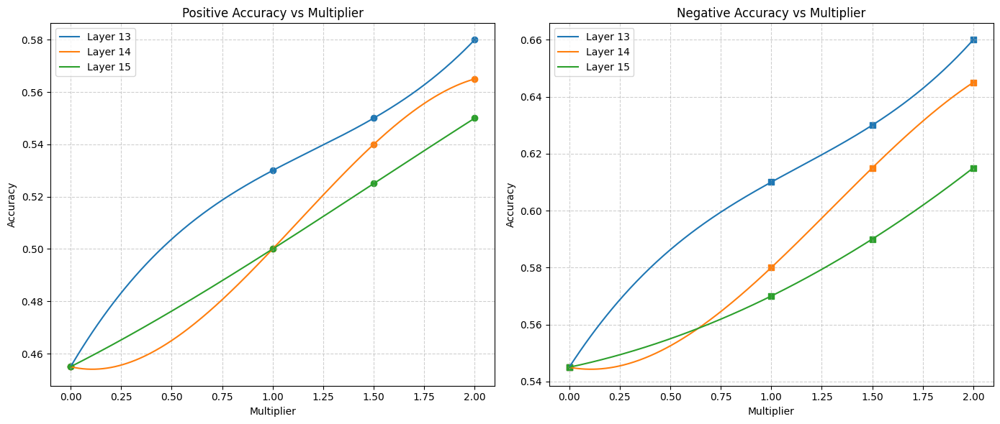

In [41]:
accuracy_instances = [
    {
        "instance_id": "Layer 13",
        "multiplier": [0, 1.0, 1.5, 2],
        "positive_accuracy": [0.4550, 0.5300, 0.5500, 0.5800],
        "negative_accuracy": [0.5450, 0.6100, 0.6300, 0.6600]
    },
    {
        "instance_id": "Layer 14",
        "multiplier": [0, 1.0, 1.5, 2],
        "positive_accuracy": [0.4550, 0.5000, 0.5400, 0.5650],
        "negative_accuracy": [0.5450, 0.5800, 0.6150, 0.6450]
    },
    {
        "instance_id": "Layer 15",
        "multiplier": [0, 1.0, 1.5, 2],
        "positive_accuracy": [0.4550, 0.5000, 0.5250, 0.5500],
        "negative_accuracy": [0.5450, 0.5700, 0.5900, 0.6150]
    }
]
plot_accuracy_instances(accuracy_instances)


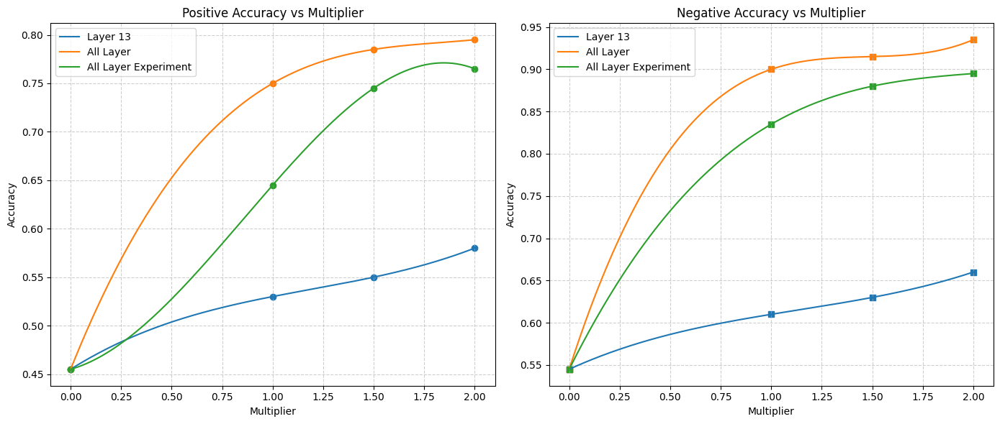

In [42]:
accuracy_instances = [
    {
        "instance_id": "Layer 13",
        "multiplier": [0, 1.0, 1.5, 2],
        "positive_accuracy": [0.4550, 0.5300, 0.5500, 0.5800],
        "negative_accuracy": [0.5450, 0.6100, 0.6300, 0.6600]
    },
    {
        "instance_id": "All Layer",
        "multiplier": [0, 1.0, 1.5, 2],
        "positive_accuracy": [0.4550, 0.7500, 0.7850, 0.7950],
        "negative_accuracy": [0.5450, 0.9000, 0.9150, 0.9350]
    },
    {
        "instance_id": "All Layer Experiment",
        "multiplier": [0, 1.0, 1.5, 2],
        "positive_accuracy": [0.4550, 0.6450, 0.7450, 0.7650],
        "negative_accuracy": [0.5450, 0.8350, 0.8800, 0.8950]
    }
]
plot_accuracy_instances(accuracy_instances)

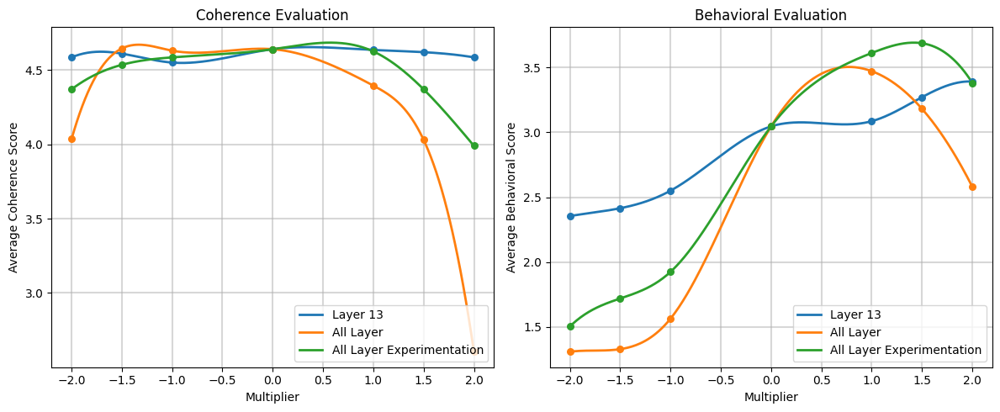

In [43]:
data = {
  'Layer 13': {
      "Coherence":{
         -2.0: 4.585, -1.5: 4.61, -1.0: 4.55, 
          0.0: 4.64,  
          1.0: 4.635,  1.5: 4.62,  2.0: 4.585
      },
      "Behavioral":{
         -2.0: 2.355, -1.5: 2.415, -1.0: 2.55, 
          0.0: 3.045,  
          1.0: 3.085,  1.5: 3.27,  2.0: 3.39
      }
  },
  'All Layer':{
      "Coherence":{
         -2.0: 4.035, -1.5: 4.645, -1.0: 4.63, 
          0.0: 4.64,  
          1.0: 4.395,  1.5: 4.03,  2.0: 2.605
      },
      "Behavioral":{
         -2.0: 1.31, -1.5: 1.33, -1.0: 1.565, 
          0.0: 3.045,  
          1.0: 3.47,  1.5: 3.18,  2.0: 2.58
      }
  },
  'All Layer Experimentation':{
      "Coherence":{
         -2.0: 4.37, -1.5: 4.535, -1.0: 4.585, 
          0.0: 4.64,  
          1.0: 4.625,  1.5: 4.37,  2.0: 3.99
      },
      "Behavioral":{
         -2.0: 1.505, -1.5: 1.72, -1.0: 1.925, 
          0.0: 3.045,  
          1.0: 3.61,  1.5: 3.685,  2.0: 3.38
      }
  },
}


plot_bipo_data(data)

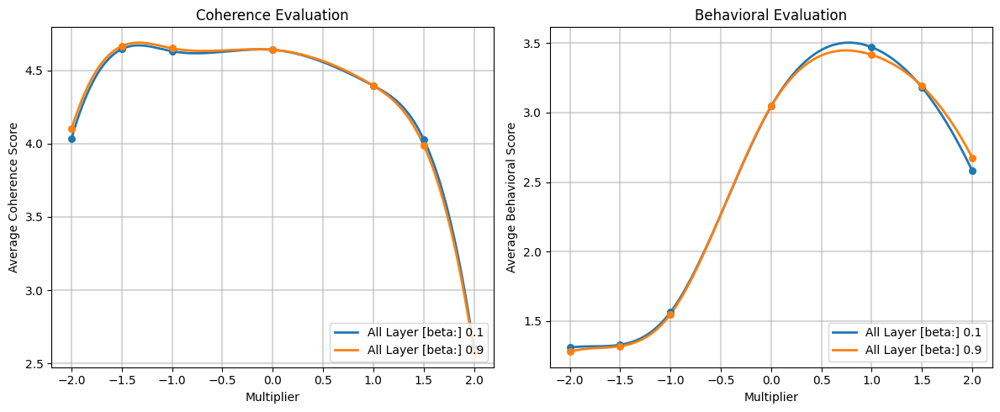

In [44]:


# --- Contoh Penggunaan Fungsi ---
data = {
  'All Layer [beta:] 0.1':{
      "Coherence":{
         -2.0: 4.035, -1.5: 4.645, -1.0: 4.63, 
          0.0: 4.64,  
          1.0: 4.395,  1.5: 4.03,  2.0: 2.605
      },
      "Behavioral":{
         -2.0: 1.31, -1.5: 1.33, -1.0: 1.565, 
          0.0: 3.045,  
          1.0: 3.47,  1.5: 3.18,  2.0: 2.58
      }
  },
  'All Layer [beta:] 0.9':{
      "Coherence":{
         -2.0: 4.1, -1.5: 4.665, -1.0: 4.65, 
          0.0: 4.64,  
          1.0: 4.395,  1.5: 3.99,  2.0: 2.58
      },
      "Behavioral":{
         -2.0: 1.28, -1.5: 1.32, -1.0: 1.55, 
          0.0: 3.045,  
          1.0: 3.415,  1.5: 3.19,  2.0: 2.675
      }
  }
}


plot_bipo_data(data)

# Projec

## 13


Layer 00 | Pos Dispersion: 502.14 | Neg Dispersion: 502.14
Layer 01 | Pos Dispersion: 610.85 | Neg Dispersion: 610.85
Layer 02 | Pos Dispersion: 796.33 | Neg Dispersion: 796.33
Layer 03 | Pos Dispersion: 1617.01 | Neg Dispersion: 1617.01
Layer 04 | Pos Dispersion: 3502.70 | Neg Dispersion: 3502.70
Layer 05 | Pos Dispersion: 4989.79 | Neg Dispersion: 4989.79
Layer 06 | Pos Dispersion: 6097.16 | Neg Dispersion: 6097.16
Layer 07 | Pos Dispersion: 19968.76 | Neg Dispersion: 19968.76
Layer 08 | Pos Dispersion: 21264.90 | Neg Dispersion: 21264.90
Layer 09 | Pos Dispersion: 21285.18 | Neg Dispersion: 21285.18
Layer 10 | Pos Dispersion: 28369.62 | Neg Dispersion: 28369.62
Layer 11 | Pos Dispersion: 48311.24 | Neg Dispersion: 48311.24
Layer 12 | Pos Dispersion: 60270.13 | Neg Dispersion: 60270.13
Layer 13 | Pos Dispersion: 91079.31 | Neg Dispersion: 91079.31
Layer 14 | Pos Dispersion: 109468.07 | Neg Dispersion: 109468.07
Layer 15 | Pos Dispersion: 155522.72 | Neg Dispersion: 155522.72
Layer 16

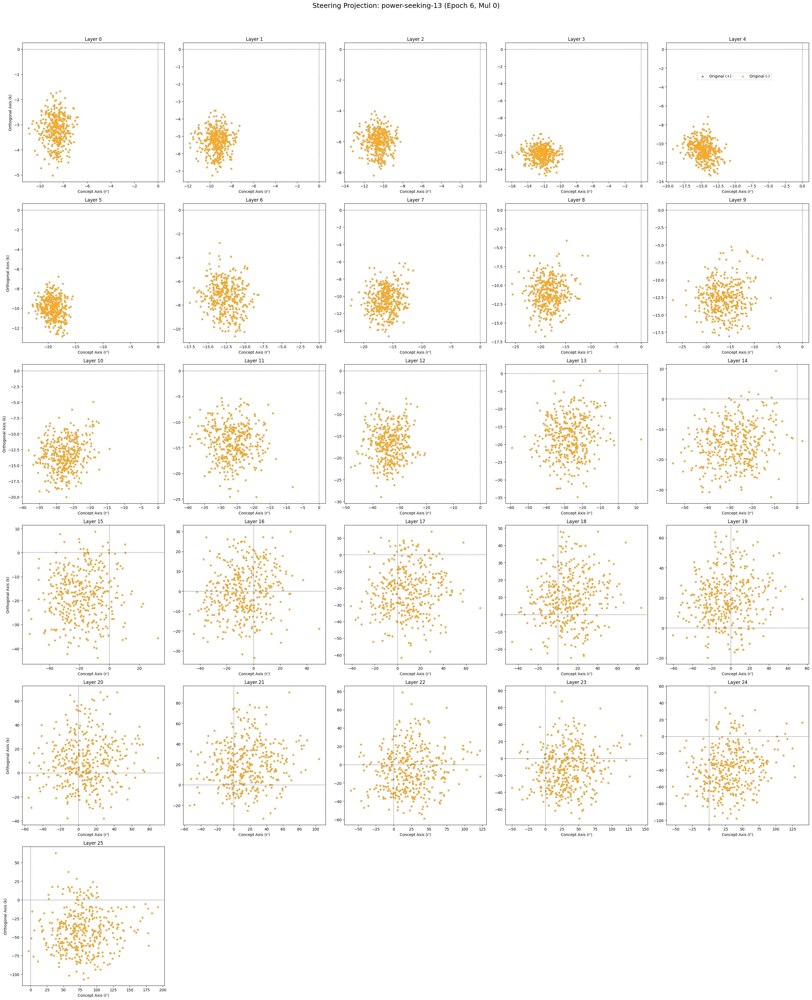

In [12]:
metrics_13_0 = plot_layer_comparison_grid(
    vec_dir="/kaggle/working/thesis/pretrained_vector/power-seeking_gemma-3/13", 
    act_dir="/kaggle/working/thesis/activation/gemma-3-1b-it/power-seeking",
    epoch=6, 
    model_id = 'power-seeking-13',
    target_layers=[x for x in range(26)], 
    mul=0,
    absolute_layer = 13
)

Layer 00 | Pos Dispersion: 502.14 | Neg Dispersion: 502.14
Layer 01 | Pos Dispersion: 610.85 | Neg Dispersion: 610.85
Layer 02 | Pos Dispersion: 796.33 | Neg Dispersion: 796.33
Layer 03 | Pos Dispersion: 1617.01 | Neg Dispersion: 1617.01
Layer 04 | Pos Dispersion: 3502.70 | Neg Dispersion: 3502.70
Layer 05 | Pos Dispersion: 4989.79 | Neg Dispersion: 4989.79
Layer 06 | Pos Dispersion: 6097.16 | Neg Dispersion: 6097.16
Layer 07 | Pos Dispersion: 19968.76 | Neg Dispersion: 19968.76
Layer 08 | Pos Dispersion: 21264.90 | Neg Dispersion: 21264.90
Layer 09 | Pos Dispersion: 21285.18 | Neg Dispersion: 21285.18
Layer 10 | Pos Dispersion: 28369.62 | Neg Dispersion: 28369.62
Layer 11 | Pos Dispersion: 48311.24 | Neg Dispersion: 48311.24
Layer 12 | Pos Dispersion: 60270.13 | Neg Dispersion: 60270.13
Layer 13 | Pos Dispersion: 91079.31 | Neg Dispersion: 91079.31
Layer 14 | Pos Dispersion: 109665.06 | Neg Dispersion: 109597.14
Layer 15 | Pos Dispersion: 156804.00 | Neg Dispersion: 155791.31
Layer 16

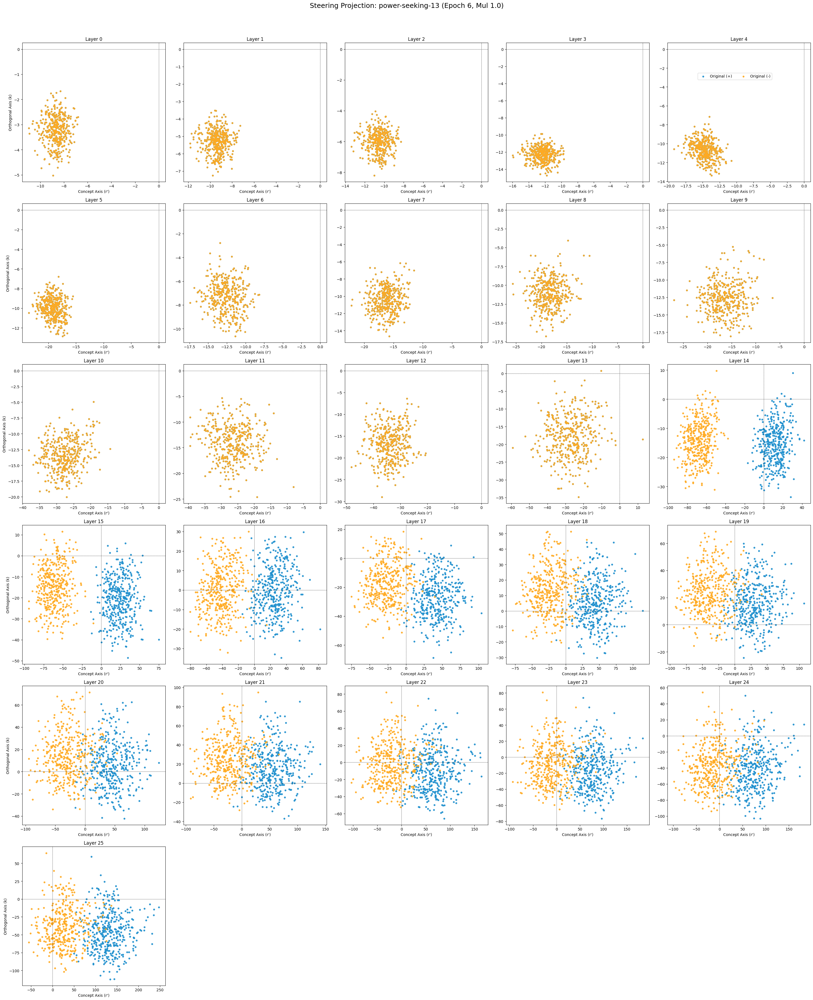

In [13]:
metrics_13_1 = plot_layer_comparison_grid(
    vec_dir="/kaggle/working/thesis/pretrained_vector/power-seeking_gemma-3/13", 
    act_dir="/kaggle/working/thesis/activation/gemma-3-1b-it/power-seeking",
    epoch=6, 
    model_id = 'power-seeking-13',
    target_layers=[x for x in range(26)], 
    mul=1.0,
    absolute_layer = 13
)

Layer 00 | Pos Dispersion: 502.14 | Neg Dispersion: 502.14
Layer 01 | Pos Dispersion: 610.85 | Neg Dispersion: 610.85
Layer 02 | Pos Dispersion: 796.33 | Neg Dispersion: 796.33
Layer 03 | Pos Dispersion: 1617.01 | Neg Dispersion: 1617.01
Layer 04 | Pos Dispersion: 3502.70 | Neg Dispersion: 3502.70
Layer 05 | Pos Dispersion: 4989.79 | Neg Dispersion: 4989.79
Layer 06 | Pos Dispersion: 6097.16 | Neg Dispersion: 6097.16
Layer 07 | Pos Dispersion: 19968.76 | Neg Dispersion: 19968.76
Layer 08 | Pos Dispersion: 21264.90 | Neg Dispersion: 21264.90
Layer 09 | Pos Dispersion: 21285.18 | Neg Dispersion: 21285.18
Layer 10 | Pos Dispersion: 28369.62 | Neg Dispersion: 28369.62
Layer 11 | Pos Dispersion: 48311.24 | Neg Dispersion: 48311.24
Layer 12 | Pos Dispersion: 60270.13 | Neg Dispersion: 60270.13
Layer 13 | Pos Dispersion: 91079.31 | Neg Dispersion: 91079.31
Layer 14 | Pos Dispersion: 109532.04 | Neg Dispersion: 109635.28
Layer 15 | Pos Dispersion: 157521.70 | Neg Dispersion: 155785.55
Layer 16

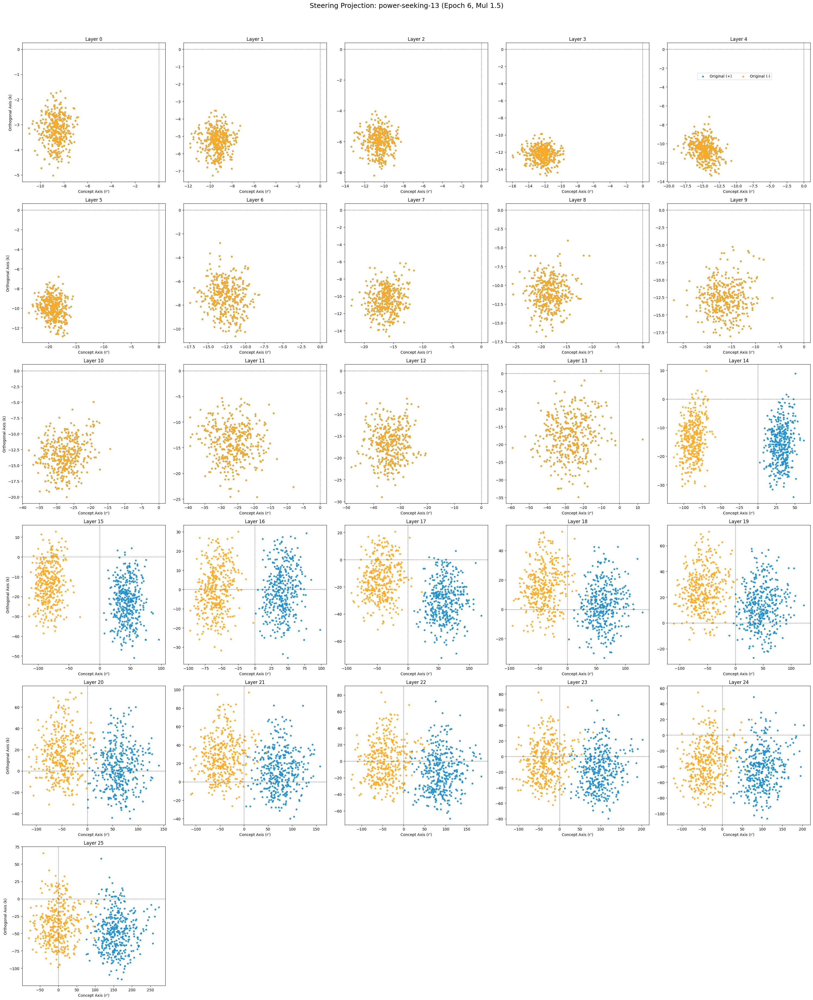

In [17]:
metrics_13_2 = plot_layer_comparison_grid(
    vec_dir="/kaggle/working/thesis/pretrained_vector/power-seeking_gemma-3/13", 
    act_dir="/kaggle/working/thesis/activation/gemma-3-1b-it/power-seeking",
    epoch=6, 
    model_id = 'power-seeking-13',
    target_layers=[x for x in range(26)], 
    mul=1.5,
    absolute_layer = 13
)

Layer 00 | Pos Dispersion: 502.14 | Neg Dispersion: 502.14
Layer 01 | Pos Dispersion: 610.85 | Neg Dispersion: 610.85
Layer 02 | Pos Dispersion: 796.33 | Neg Dispersion: 796.33
Layer 03 | Pos Dispersion: 1617.01 | Neg Dispersion: 1617.01
Layer 04 | Pos Dispersion: 3502.70 | Neg Dispersion: 3502.70
Layer 05 | Pos Dispersion: 4989.79 | Neg Dispersion: 4989.79
Layer 06 | Pos Dispersion: 6097.16 | Neg Dispersion: 6097.16
Layer 07 | Pos Dispersion: 19968.76 | Neg Dispersion: 19968.76
Layer 08 | Pos Dispersion: 21264.90 | Neg Dispersion: 21264.90
Layer 09 | Pos Dispersion: 21285.18 | Neg Dispersion: 21285.18
Layer 10 | Pos Dispersion: 28369.62 | Neg Dispersion: 28369.62
Layer 11 | Pos Dispersion: 48311.24 | Neg Dispersion: 48311.24
Layer 12 | Pos Dispersion: 60270.13 | Neg Dispersion: 60270.13
Layer 13 | Pos Dispersion: 91079.31 | Neg Dispersion: 91079.31
Layer 14 | Pos Dispersion: 110114.66 | Neg Dispersion: 109907.92
Layer 15 | Pos Dispersion: 157157.72 | Neg Dispersion: 155259.72
Layer 16

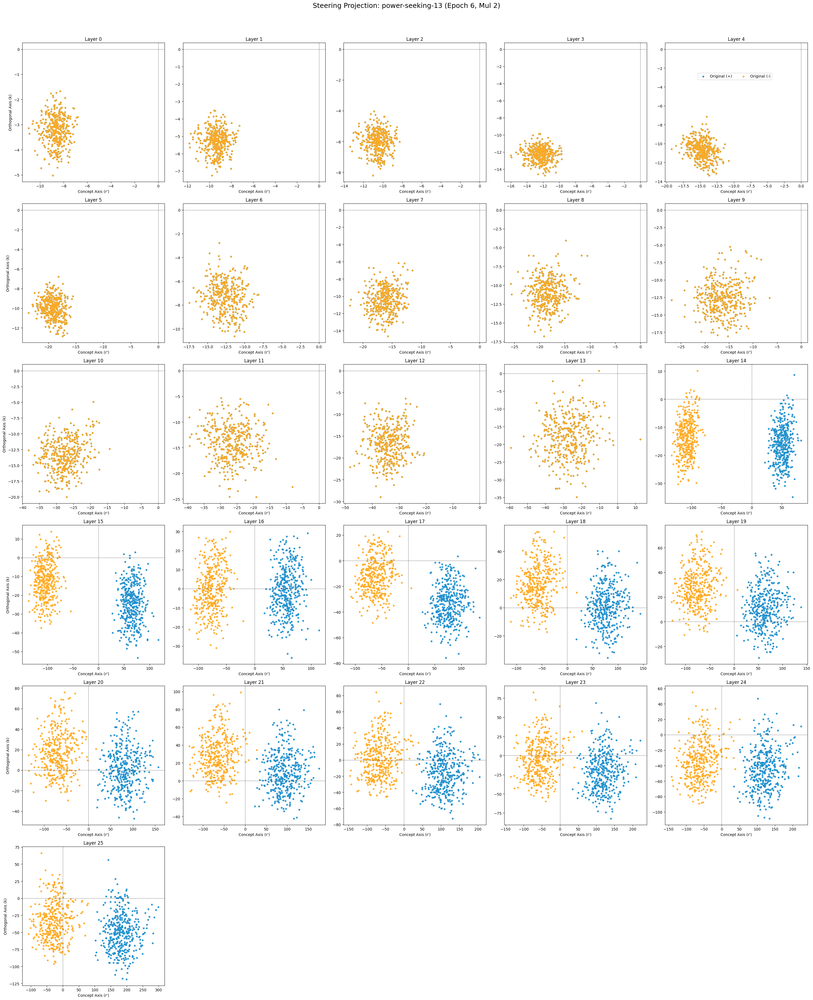

In [18]:
metrics_13_3 = plot_layer_comparison_grid(
    vec_dir="/kaggle/working/thesis/pretrained_vector/power-seeking_gemma-3/13", 
    act_dir="/kaggle/working/thesis/activation/gemma-3-1b-it/power-seeking",
    epoch=6, 
    model_id = 'power-seeking-13',
    target_layers=[x for x in range(26)], 
    mul=2,
    absolute_layer = 13
)

## All

Layer 00 | Pos Dispersion: 502.14 | Neg Dispersion: 502.14
Layer 01 | Pos Dispersion: 610.85 | Neg Dispersion: 610.85
Layer 02 | Pos Dispersion: 796.33 | Neg Dispersion: 796.33
Layer 03 | Pos Dispersion: 1617.01 | Neg Dispersion: 1617.01
Layer 04 | Pos Dispersion: 3502.70 | Neg Dispersion: 3502.70
Layer 05 | Pos Dispersion: 4989.79 | Neg Dispersion: 4989.79
Layer 06 | Pos Dispersion: 6097.16 | Neg Dispersion: 6097.16
Layer 07 | Pos Dispersion: 19968.76 | Neg Dispersion: 19968.76
Layer 08 | Pos Dispersion: 21264.90 | Neg Dispersion: 21264.90
Layer 09 | Pos Dispersion: 21285.18 | Neg Dispersion: 21285.18
Layer 10 | Pos Dispersion: 28369.62 | Neg Dispersion: 28369.62
Layer 11 | Pos Dispersion: 48311.24 | Neg Dispersion: 48311.24
Layer 12 | Pos Dispersion: 60270.13 | Neg Dispersion: 60270.13
Layer 13 | Pos Dispersion: 91079.31 | Neg Dispersion: 91079.31
Layer 14 | Pos Dispersion: 109468.07 | Neg Dispersion: 109468.07
Layer 15 | Pos Dispersion: 155522.72 | Neg Dispersion: 155522.72
Layer 16

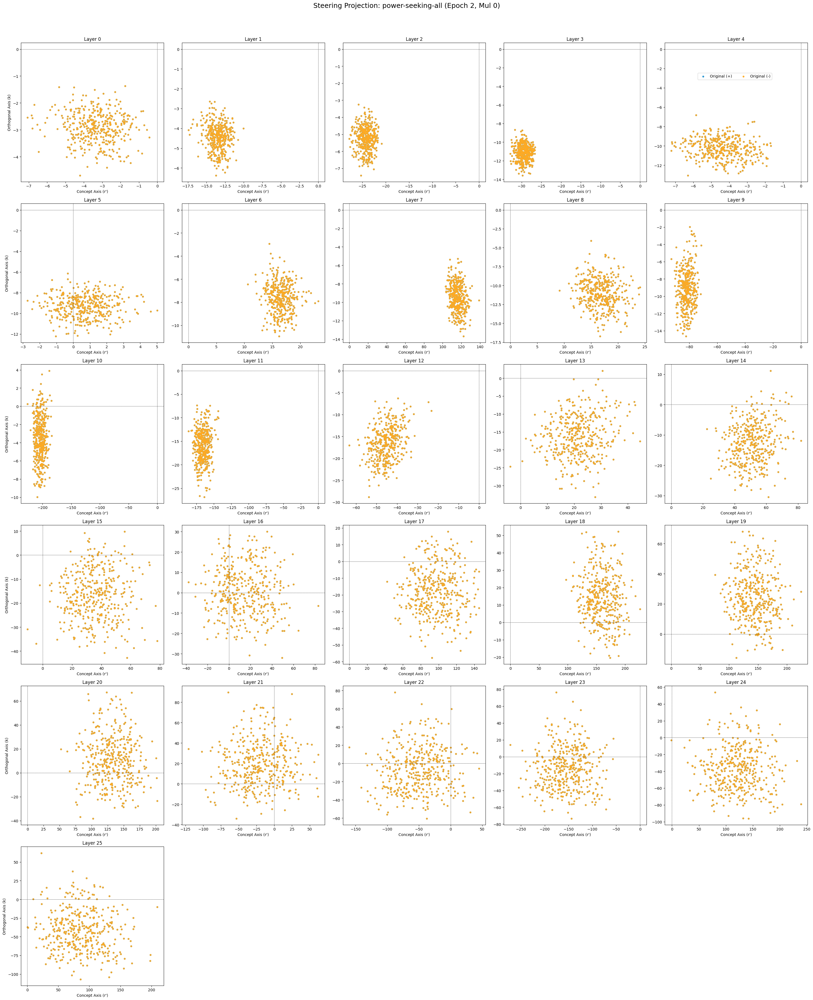

In [31]:
metrics_all_0 = plot_layer_comparison_grid(
    vec_dir="/kaggle/working/thesis/pretrained_vector/power-seeking_gemma-3/all", 
    act_dir="/kaggle/working/thesis/activation/gemma-3-1b-it/power-seeking",
    epoch=2, 
    model_id = 'power-seeking-all',
    target_layers=[x for x in range(26)], 
    mul=0
)

Layer 00 | Pos Dispersion: 502.14 | Neg Dispersion: 502.14
Layer 01 | Pos Dispersion: 615.39 | Neg Dispersion: 614.26
Layer 02 | Pos Dispersion: 767.27 | Neg Dispersion: 835.15
Layer 03 | Pos Dispersion: 1560.06 | Neg Dispersion: 1691.44
Layer 04 | Pos Dispersion: 3222.61 | Neg Dispersion: 3820.80
Layer 05 | Pos Dispersion: 4565.51 | Neg Dispersion: 5898.94
Layer 06 | Pos Dispersion: 5842.49 | Neg Dispersion: 6999.00
Layer 07 | Pos Dispersion: 18503.27 | Neg Dispersion: 24873.60
Layer 08 | Pos Dispersion: 19881.11 | Neg Dispersion: 26198.23
Layer 09 | Pos Dispersion: 21373.68 | Neg Dispersion: 23119.70
Layer 10 | Pos Dispersion: 28190.02 | Neg Dispersion: 29752.59
Layer 11 | Pos Dispersion: 47489.09 | Neg Dispersion: 53287.72
Layer 12 | Pos Dispersion: 57533.54 | Neg Dispersion: 65986.98
Layer 13 | Pos Dispersion: 87328.16 | Neg Dispersion: 93428.30
Layer 14 | Pos Dispersion: 102926.48 | Neg Dispersion: 111361.42
Layer 15 | Pos Dispersion: 146473.86 | Neg Dispersion: 151237.23
Layer 16

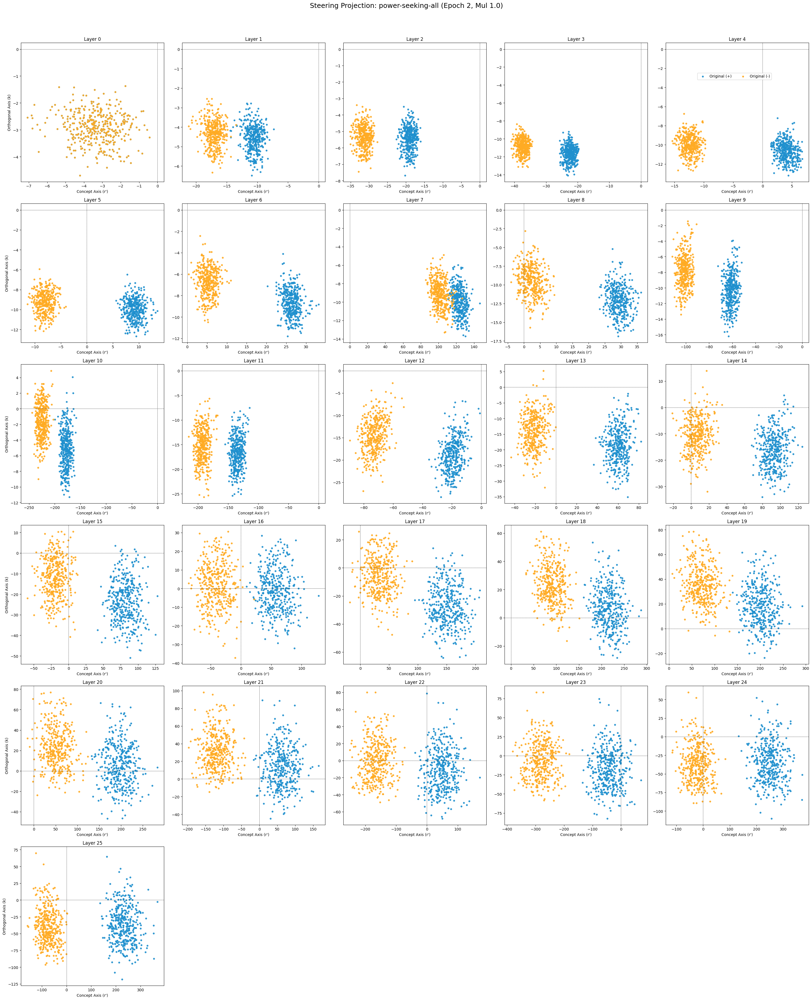

In [21]:
metrics_all_1 = plot_layer_comparison_grid(
    vec_dir="/kaggle/working/thesis/pretrained_vector/power-seeking_gemma-3/all", 
    act_dir="/kaggle/working/thesis/activation/gemma-3-1b-it/power-seeking",
    epoch=2, 
    model_id = 'power-seeking-all',
    target_layers=[x for x in range(26)], 
    mul=1.0
)

Layer 00 | Pos Dispersion: 502.14 | Neg Dispersion: 502.14
Layer 01 | Pos Dispersion: 616.35 | Neg Dispersion: 618.66
Layer 02 | Pos Dispersion: 764.29 | Neg Dispersion: 846.36
Layer 03 | Pos Dispersion: 1523.24 | Neg Dispersion: 1692.72
Layer 04 | Pos Dispersion: 3057.83 | Neg Dispersion: 3860.18
Layer 05 | Pos Dispersion: 4343.83 | Neg Dispersion: 6098.92
Layer 06 | Pos Dispersion: 5887.67 | Neg Dispersion: 7588.60
Layer 07 | Pos Dispersion: 18086.00 | Neg Dispersion: 28937.86
Layer 08 | Pos Dispersion: 19334.69 | Neg Dispersion: 29231.50
Layer 09 | Pos Dispersion: 20717.87 | Neg Dispersion: 25530.98
Layer 10 | Pos Dispersion: 28357.09 | Neg Dispersion: 33111.57
Layer 11 | Pos Dispersion: 47217.63 | Neg Dispersion: 59000.93
Layer 12 | Pos Dispersion: 58781.45 | Neg Dispersion: 71395.02
Layer 13 | Pos Dispersion: 84069.80 | Neg Dispersion: 96085.16
Layer 14 | Pos Dispersion: 97554.18 | Neg Dispersion: 113981.39
Layer 15 | Pos Dispersion: 136977.55 | Neg Dispersion: 147027.33
Layer 16 

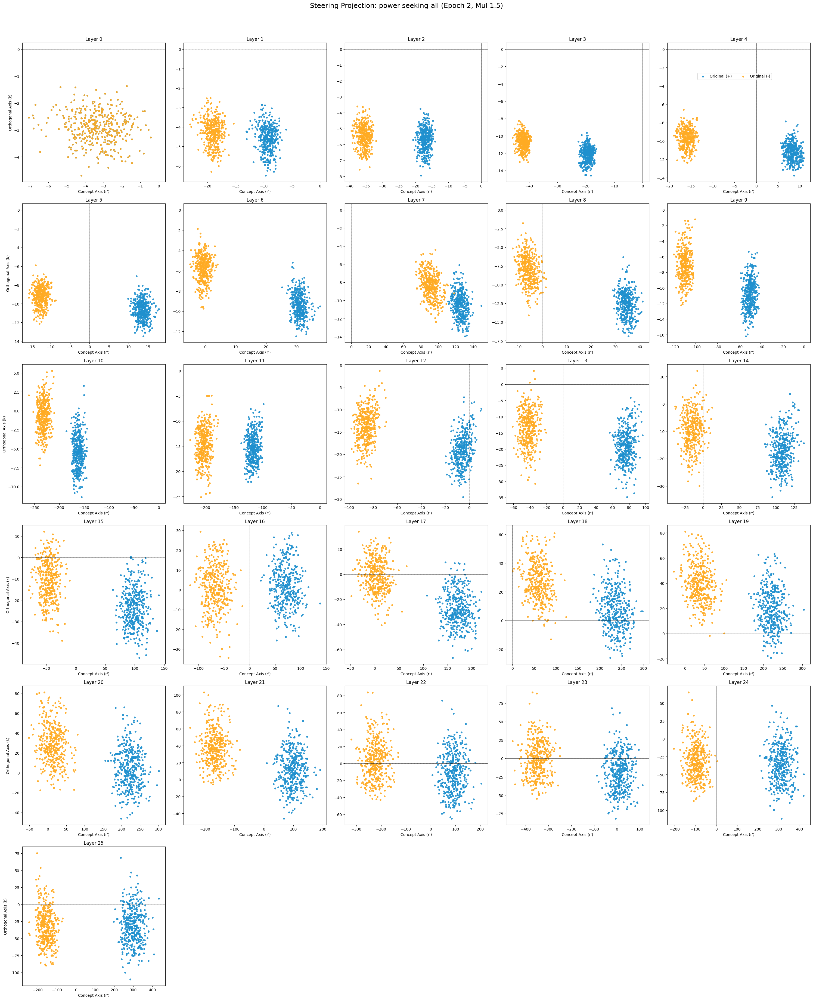

In [22]:
metrics_all_2 = plot_layer_comparison_grid(
    vec_dir="/kaggle/working/thesis/pretrained_vector/power-seeking_gemma-3/all", 
    act_dir="/kaggle/working/thesis/activation/gemma-3-1b-it/power-seeking",
    epoch=2, 
    model_id = 'power-seeking-all',
    target_layers=[x for x in range(26)], 
    mul=1.5
)

Layer 00 | Pos Dispersion: 502.14 | Neg Dispersion: 502.14
Layer 01 | Pos Dispersion: 614.57 | Neg Dispersion: 621.74
Layer 02 | Pos Dispersion: 766.77 | Neg Dispersion: 853.87
Layer 03 | Pos Dispersion: 1490.47 | Neg Dispersion: 1633.62
Layer 04 | Pos Dispersion: 2903.77 | Neg Dispersion: 3587.93
Layer 05 | Pos Dispersion: 4210.06 | Neg Dispersion: 5892.02
Layer 06 | Pos Dispersion: 5799.68 | Neg Dispersion: 8021.92
Layer 07 | Pos Dispersion: 16922.22 | Neg Dispersion: 31623.65
Layer 08 | Pos Dispersion: 19683.52 | Neg Dispersion: 30965.49
Layer 09 | Pos Dispersion: 20108.73 | Neg Dispersion: 29543.34
Layer 10 | Pos Dispersion: 29085.55 | Neg Dispersion: 37992.27
Layer 11 | Pos Dispersion: 48064.64 | Neg Dispersion: 69764.84
Layer 12 | Pos Dispersion: 63131.98 | Neg Dispersion: 80387.72
Layer 13 | Pos Dispersion: 85380.59 | Neg Dispersion: 101669.41
Layer 14 | Pos Dispersion: 93925.96 | Neg Dispersion: 118469.09
Layer 15 | Pos Dispersion: 127482.79 | Neg Dispersion: 143690.28
Layer 16

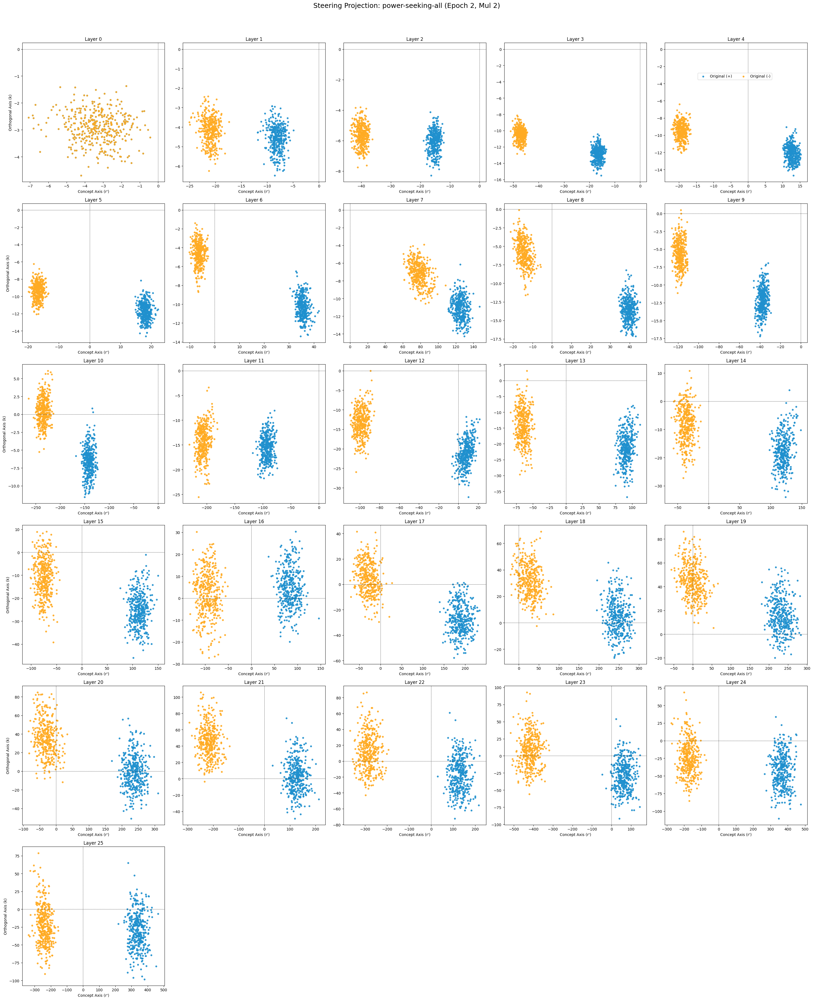

In [23]:
metrics_all_3 = plot_layer_comparison_grid(
    vec_dir="/kaggle/working/thesis/pretrained_vector/power-seeking_gemma-3/all", 
    act_dir="/kaggle/working/thesis/activation/gemma-3-1b-it/power-seeking",
    epoch=2, 
    model_id = 'power-seeking-all',
    target_layers=[x for x in range(26)], 
    mul=2
)

## All - exp

Layer 00 | Pos Dispersion: 502.14 | Neg Dispersion: 502.14
Layer 01 | Pos Dispersion: 610.85 | Neg Dispersion: 610.85
Layer 02 | Pos Dispersion: 796.33 | Neg Dispersion: 796.33
Layer 03 | Pos Dispersion: 1617.01 | Neg Dispersion: 1617.01
Layer 04 | Pos Dispersion: 3502.70 | Neg Dispersion: 3502.70
Layer 05 | Pos Dispersion: 4989.79 | Neg Dispersion: 4989.79
Layer 06 | Pos Dispersion: 6097.16 | Neg Dispersion: 6097.16
Layer 07 | Pos Dispersion: 19968.76 | Neg Dispersion: 19968.76
Layer 08 | Pos Dispersion: 21264.90 | Neg Dispersion: 21264.90
Layer 09 | Pos Dispersion: 21285.18 | Neg Dispersion: 21285.18
Layer 10 | Pos Dispersion: 28369.62 | Neg Dispersion: 28369.62
Layer 11 | Pos Dispersion: 48311.24 | Neg Dispersion: 48311.24
Layer 12 | Pos Dispersion: 60270.13 | Neg Dispersion: 60270.13
Layer 13 | Pos Dispersion: 91079.31 | Neg Dispersion: 91079.31
Layer 14 | Pos Dispersion: 109468.07 | Neg Dispersion: 109468.07
Layer 15 | Pos Dispersion: 155522.72 | Neg Dispersion: 155522.72
Layer 16

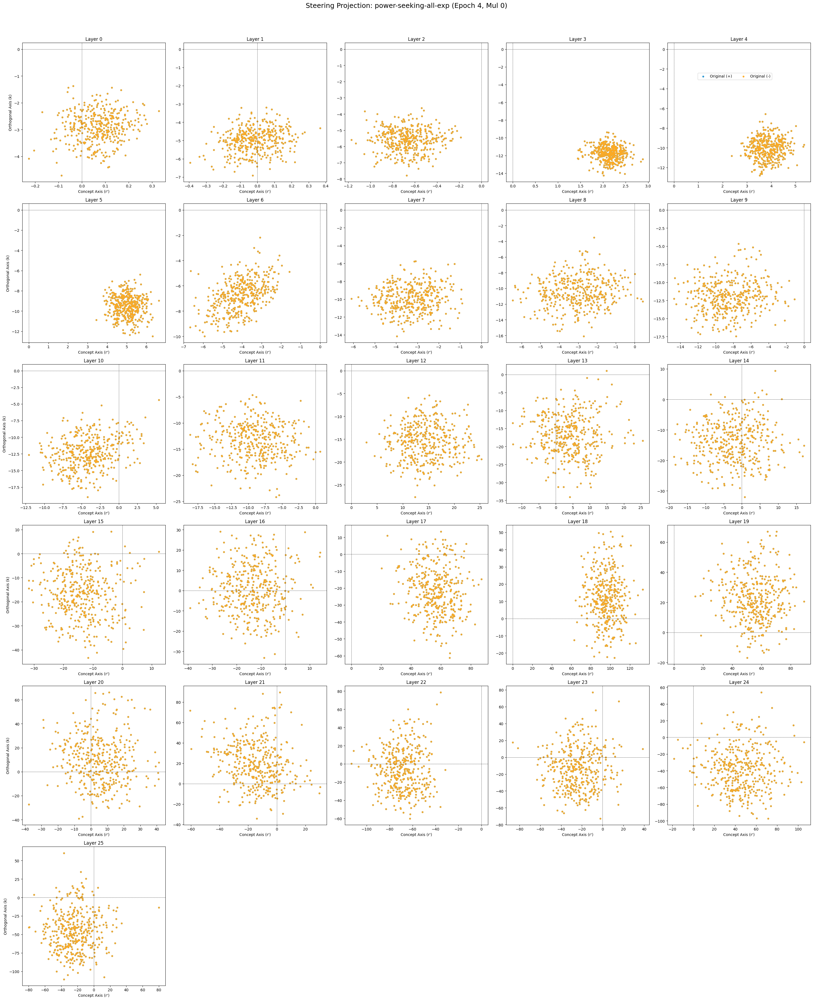

In [24]:
metrics_all_exp_0 = plot_layer_comparison_grid(
    vec_dir="/kaggle/working/thesis/pretrained_vector/power-seeking_gemma-3/all-exp", 
    act_dir="/kaggle/working/thesis/activation/gemma-3-1b-it/power-seeking",
    epoch=4, 
    model_id = 'power-seeking-all-exp',
    target_layers=[x for x in range(26)], 
    mul=0
)

Layer 00 | Pos Dispersion: 502.14 | Neg Dispersion: 502.14
Layer 01 | Pos Dispersion: 623.89 | Neg Dispersion: 604.11
Layer 02 | Pos Dispersion: 796.81 | Neg Dispersion: 787.43
Layer 03 | Pos Dispersion: 1584.27 | Neg Dispersion: 1677.74
Layer 04 | Pos Dispersion: 3512.21 | Neg Dispersion: 3493.67
Layer 05 | Pos Dispersion: 5254.76 | Neg Dispersion: 5273.86
Layer 06 | Pos Dispersion: 5773.88 | Neg Dispersion: 7094.28
Layer 07 | Pos Dispersion: 20191.41 | Neg Dispersion: 22904.94
Layer 08 | Pos Dispersion: 20782.03 | Neg Dispersion: 23044.61
Layer 09 | Pos Dispersion: 20918.60 | Neg Dispersion: 22186.29
Layer 10 | Pos Dispersion: 26881.03 | Neg Dispersion: 28163.39
Layer 11 | Pos Dispersion: 47403.18 | Neg Dispersion: 48990.80
Layer 12 | Pos Dispersion: 59167.93 | Neg Dispersion: 61801.72
Layer 13 | Pos Dispersion: 89565.96 | Neg Dispersion: 91003.29
Layer 14 | Pos Dispersion: 106882.58 | Neg Dispersion: 111048.86
Layer 15 | Pos Dispersion: 153886.48 | Neg Dispersion: 153699.19
Layer 16

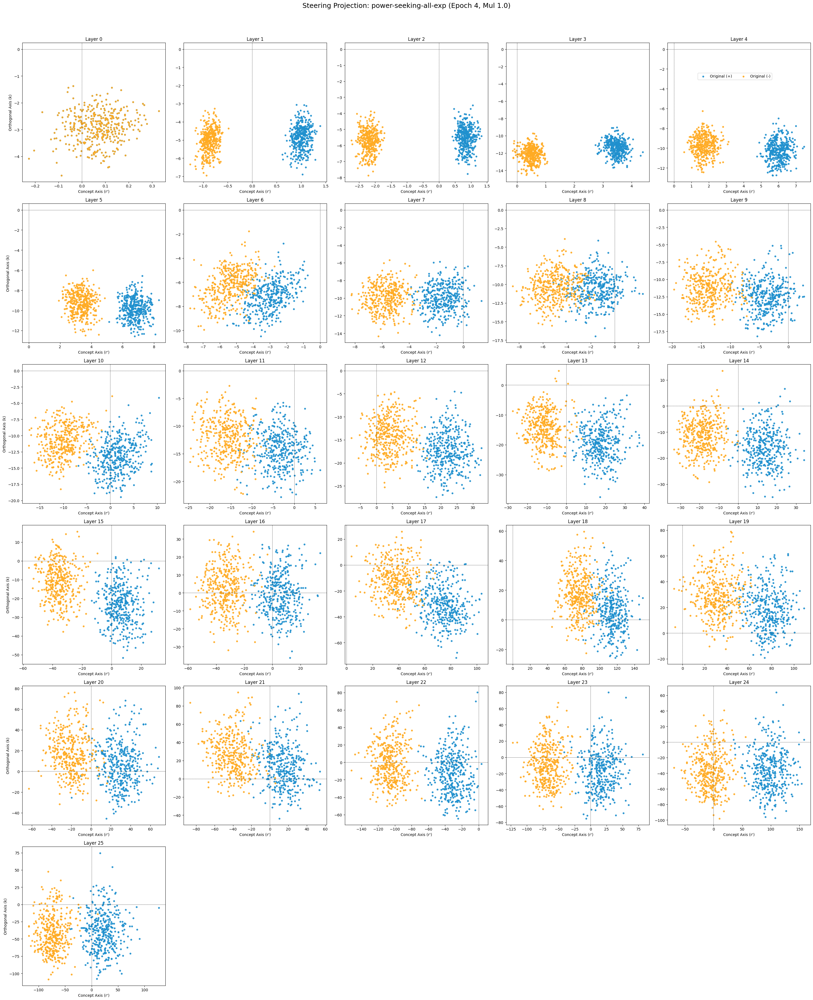

In [25]:
metrics_all_exp_1 = plot_layer_comparison_grid(
    vec_dir="/kaggle/working/thesis/pretrained_vector/power-seeking_gemma-3/all-exp", 
    act_dir="/kaggle/working/thesis/activation/gemma-3-1b-it/power-seeking",
    epoch=4, 
    model_id = 'power-seeking-all-exp',
    target_layers=[x for x in range(26)], 
    mul=1.0
)

Layer 00 | Pos Dispersion: 502.14 | Neg Dispersion: 502.14
Layer 01 | Pos Dispersion: 631.07 | Neg Dispersion: 601.19
Layer 02 | Pos Dispersion: 795.06 | Neg Dispersion: 782.39
Layer 03 | Pos Dispersion: 1570.00 | Neg Dispersion: 1702.17
Layer 04 | Pos Dispersion: 3588.13 | Neg Dispersion: 3481.94
Layer 05 | Pos Dispersion: 5403.36 | Neg Dispersion: 5421.11
Layer 06 | Pos Dispersion: 5827.31 | Neg Dispersion: 7524.90
Layer 07 | Pos Dispersion: 21252.12 | Neg Dispersion: 25506.23
Layer 08 | Pos Dispersion: 21842.35 | Neg Dispersion: 23882.10
Layer 09 | Pos Dispersion: 21062.56 | Neg Dispersion: 23294.71
Layer 10 | Pos Dispersion: 27300.68 | Neg Dispersion: 28456.21
Layer 11 | Pos Dispersion: 48001.66 | Neg Dispersion: 51174.89
Layer 12 | Pos Dispersion: 59444.86 | Neg Dispersion: 64771.96
Layer 13 | Pos Dispersion: 88722.83 | Neg Dispersion: 92834.44
Layer 14 | Pos Dispersion: 104437.43 | Neg Dispersion: 113516.78
Layer 15 | Pos Dispersion: 149881.94 | Neg Dispersion: 150787.86
Layer 16

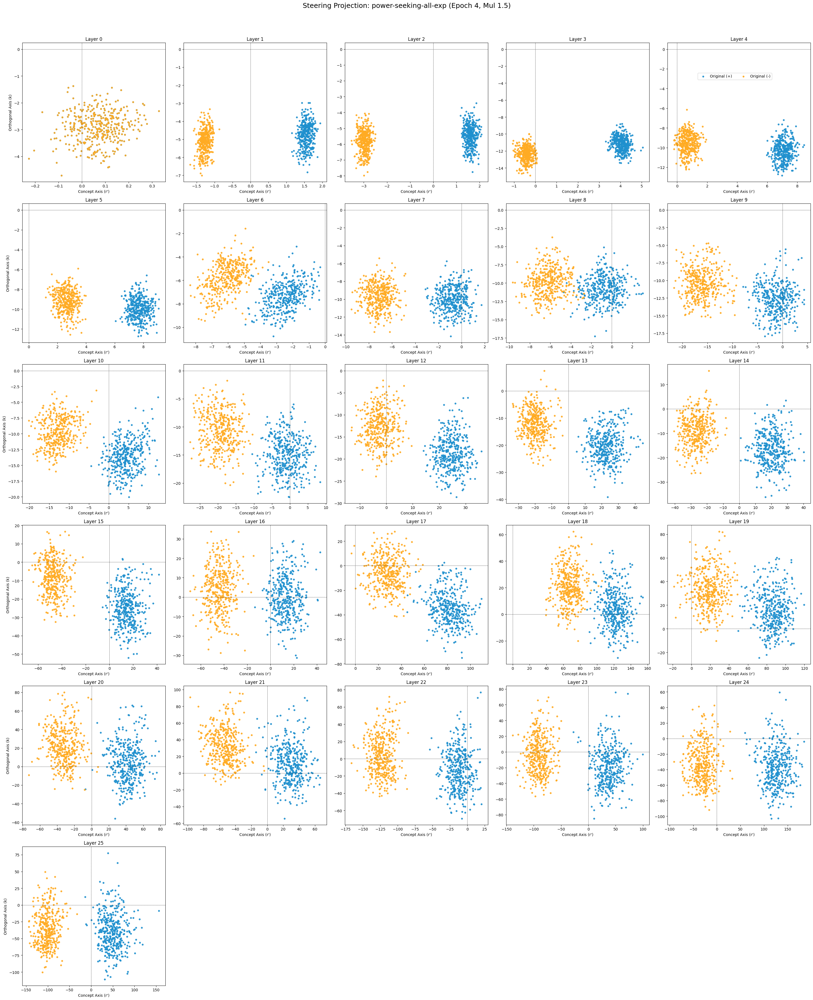

In [26]:
metrics_all_exp_2 = plot_layer_comparison_grid(
    vec_dir="/kaggle/working/thesis/pretrained_vector/power-seeking_gemma-3/all-exp", 
    act_dir="/kaggle/working/thesis/activation/gemma-3-1b-it/power-seeking",
    epoch=4, 
    model_id = 'power-seeking-all-exp',
    target_layers=[x for x in range(26)], 
    mul=1.5
)

Layer 00 | Pos Dispersion: 502.14 | Neg Dispersion: 502.14
Layer 01 | Pos Dispersion: 638.34 | Neg Dispersion: 599.03
Layer 02 | Pos Dispersion: 793.91 | Neg Dispersion: 779.66
Layer 03 | Pos Dispersion: 1567.09 | Neg Dispersion: 1743.17
Layer 04 | Pos Dispersion: 3577.21 | Neg Dispersion: 3417.38
Layer 05 | Pos Dispersion: 5410.84 | Neg Dispersion: 5398.77
Layer 06 | Pos Dispersion: 5935.56 | Neg Dispersion: 7684.87
Layer 07 | Pos Dispersion: 22603.07 | Neg Dispersion: 28206.03
Layer 08 | Pos Dispersion: 23358.21 | Neg Dispersion: 24620.01
Layer 09 | Pos Dispersion: 22397.60 | Neg Dispersion: 25198.95
Layer 10 | Pos Dispersion: 29177.93 | Neg Dispersion: 30666.25
Layer 11 | Pos Dispersion: 51430.55 | Neg Dispersion: 58361.69
Layer 12 | Pos Dispersion: 63518.30 | Neg Dispersion: 73091.35
Layer 13 | Pos Dispersion: 91103.03 | Neg Dispersion: 98992.83
Layer 14 | Pos Dispersion: 102888.80 | Neg Dispersion: 118097.31
Layer 15 | Pos Dispersion: 144776.19 | Neg Dispersion: 148595.19
Layer 16

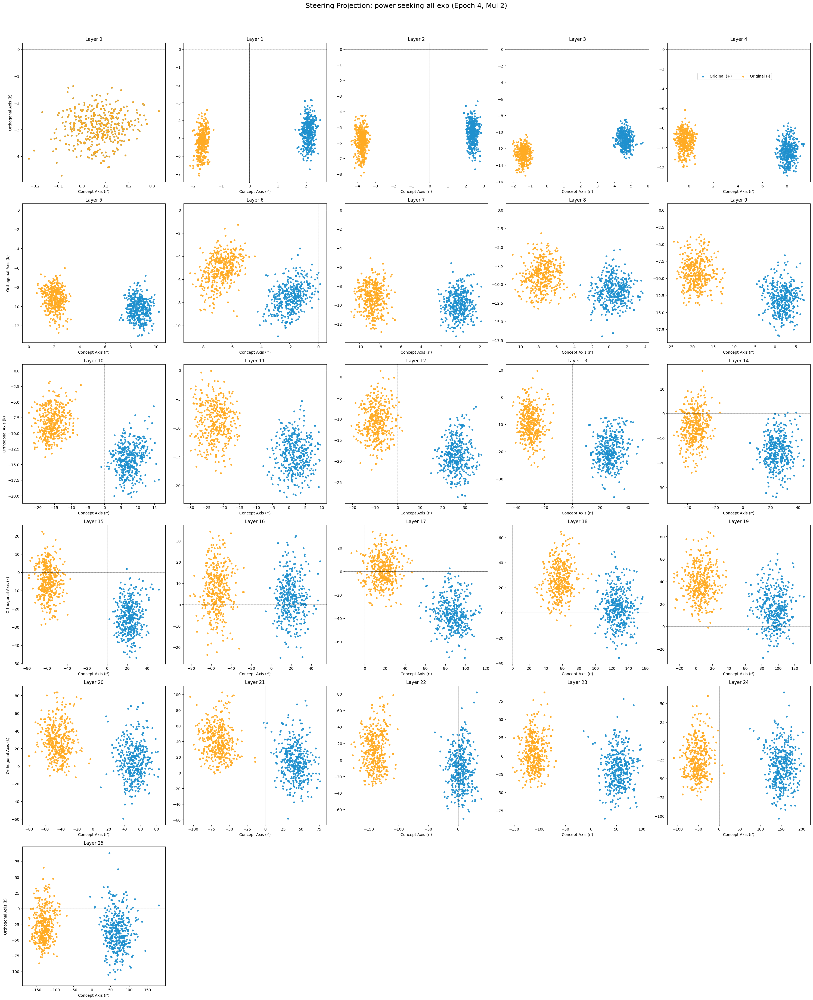

In [27]:
metrics_all_exp_3 = plot_layer_comparison_grid(
    vec_dir="/kaggle/working/thesis/pretrained_vector/power-seeking_gemma-3/all-exp", 
    act_dir="/kaggle/working/thesis/activation/gemma-3-1b-it/power-seeking",
    epoch=4, 
    model_id = 'power-seeking-all-exp',
    target_layers=[x for x in range(26)], 
    mul=2
)

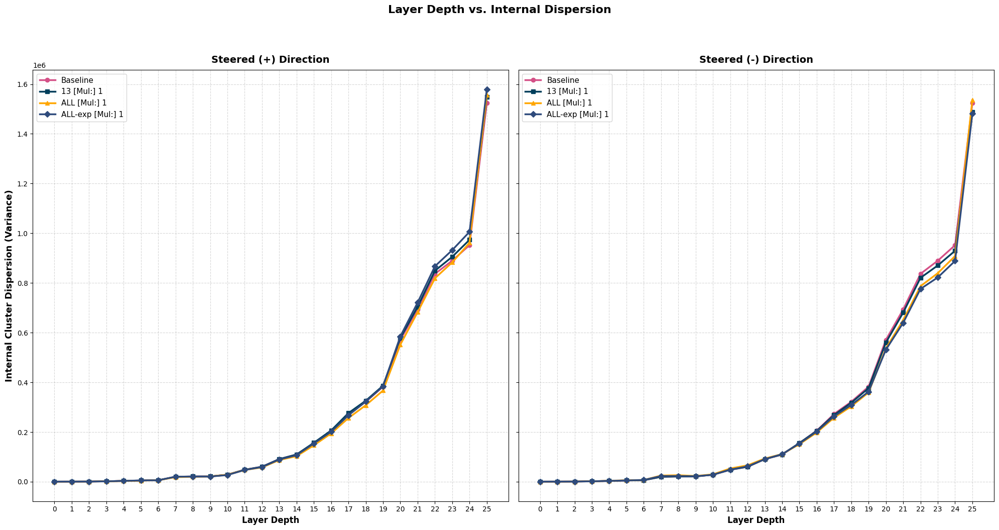

In [34]:
plot_dispersion_comparison_separated({
    'Baseline': metrics_13_0,
    '13 [Mul:] 1': metrics_13_1,
    'ALL [Mul:] 1': metrics_all_1,
    'ALL-exp [Mul:] 1': metrics_all_exp_1
})

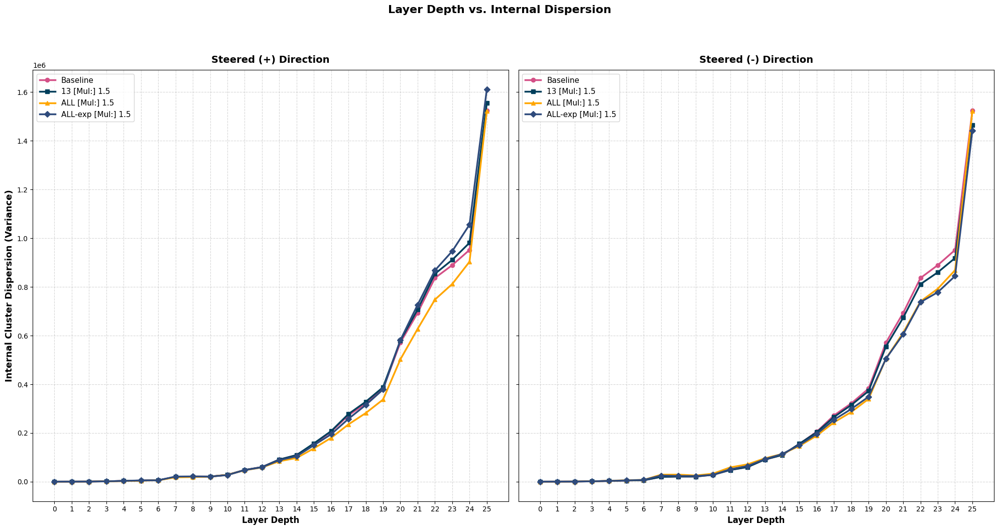

In [35]:
plot_dispersion_comparison_separated({
    'Baseline': metrics_all_0,
    '13 [Mul:] 1.5': metrics_13_2,
    'ALL [Mul:] 1.5': metrics_all_2,
    'ALL-exp [Mul:] 1.5': metrics_all_exp_2
    
})

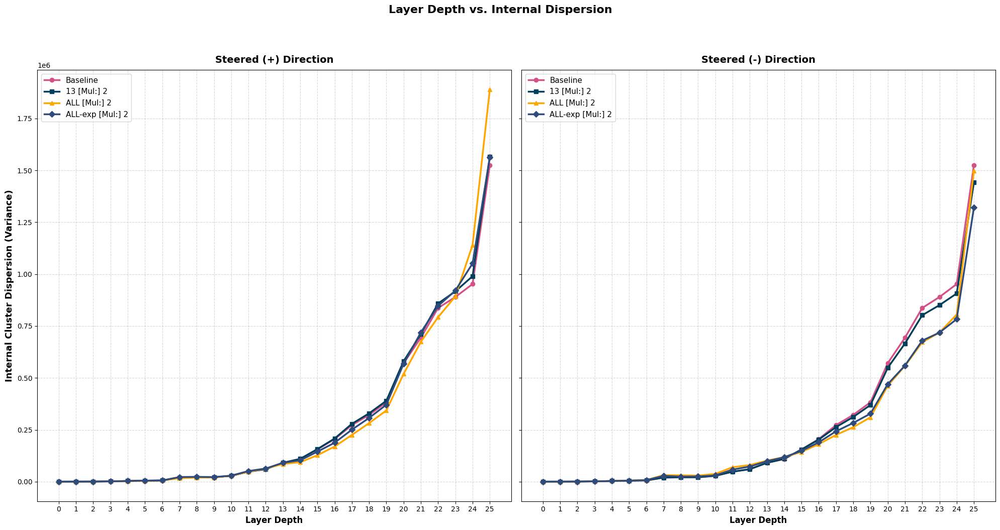

In [36]:
plot_dispersion_comparison_separated({
    'Baseline': metrics_all_exp_0,
    '13 [Mul:] 2': metrics_13_3,
    'ALL [Mul:] 2': metrics_all_3,
    'ALL-exp [Mul:] 2': metrics_all_exp_3,
})